# 📚 Import libraries

In [ ]:
# Set seed for reproducibility
seed = 42

import numpy as np
import random
import os

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
import keras_cv
from imblearn.over_sampling import SMOTE

np.random.seed(42)
tf.random.set_seed(42);

# 🎞️ Load and prepare dataset

Load dataset

In [ ]:
data = np.load("training_set.npz")
images = data['images']
labels = data['labels']

Remove outliers and duplicates

In [ ]:
# Remove outliers found after data exploration
images = images_array[:11959]
labels = labels_array[:11959]

# Remove duplicates
seen_images = {}
dup_indexes = []

unique_images = []
unique_labels = []

for i in range(len(images_array_no_ol)):
  image = images_array_no_ol[i]
  label = labels_array_no_ol[i]

  image_str = str(image.tobytes())

  # Check if the image has already been seen
  if image_str not in seen_images:
    unique_images.append(image)
    unique_labels.append(label)
    seen_images[image_str] = 1
  else:
    dup_indexes.append(i)

images = np.array(unique_images)
labels = np.array(unique_labels)

Encode labels and split data into train, validation and test

In [ ]:
X = images
y = tfk.utils.to_categorical(labels)

# Split data into training and test sets, maintaining class distribution
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, random_state=seed, test_size=0.1, stratify=np.argmax(labels,axis=1))
# Split data into training and validation sets, maintaining class distribution
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=seed, test_size=0.2, stratify=np.argmax(y_train_val,axis=1))
# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

X_train shape: (8604, 96, 96, 3), y_train shape: (8604, 8)
X_val shape: (2151, 96, 96, 3), y_val shape: (2151, 8)
X_test shape: (1196, 96, 96, 3), y_test shape: (1196, 8)


## ⚖️ Data balancing using SMOTE

In [ ]:
# Reshape the data for SMOTE
X_train_reshaped = X_train.reshape(X_train.shape[0], -1)

# Apply SMOTE
smote = SMOTE(random_state=seed)
X_train_smote, y_train_smote = smote.fit_resample(X_train_reshaped, np.argmax(y_train, axis=1))

# Reshape the data back to its original shape
X_train_smote = X_train_smote.reshape(-1, 96, 96, 3)

X_train = X_train_smote
y_train = tfk.utils.to_categorical(y_train_smote)

# Now X_train and y_train contain the oversampled data
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")

X_train shape: (13512, 96, 96, 3), y_train shape: (13512, 8)


## 👨🏻‍🎨 Apply augmentations

In [ ]:
# Define RandAugment and AugMix layers
randaugment = keras_cv.layers.RandAugment(value_range=(0, 255), augmentations_per_image=3, magnitude=0.5, seed=seed)
augmix = keras_cv.layers.AugMix(value_range=(0, 255), severity=0.3, num_chains=3, alpha=1.0, seed=seed)

# Apply augmentations to training set
X_train_randaugment = randaugment(X_train)
X_train = augmix(X_train_randaugment)

# Apply augmentations to validation set
X_val_randaugment = randaugment(X_val)
X_val = augmix(X_val_randaugment)

# Apply augmentations to test set
X_test_randaugment = randaugment(X_test)
X_test = augmix(X_test_randaugment)

# 🧊 Transfer Learning

## 🏗️ Build model

Set network parameters

In [ ]:
# Input shape for the model
input_shape = X_train.shape[1:]
# Output shape for the model
output_shape = y_train.shape[1]
# Number of training epochs
epochs = 200
# Batch size for training
batch_size = 32
# Learning rate: step size for updating the model's weights
learning_rate = 0.001
# Dropout rate
dropout_rate = 0.3
# Parameter for regularization
l1_lambda = 1e-5
l2_lambda = 1e-4
# Define the patience value for early stopping
patience = 20
# Create an EarlyStopping callback
early_stopping = tfk.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=patience,
    restore_best_weights=True
)
# Store the callback in a list
callbacks = [early_stopping]

Build the model

In [ ]:
# Initialise EfficientNetV2B3 model without pretrained weights, for custom training
effnet = tfk.applications.EfficientNetV2B3(
    input_shape=input_shape,
    include_top=False,
    weights='imagenet',
    pooling='avg',
    include_preprocessing=True
)

52606240/52606240 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ preprocessing (Sequential)      │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_flip (RandomFlip)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_translation         │ (None, 96, 96, 3)      │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ random_rotation            │ (None, 96, 96, 3)      │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ grid_mask (GridMask)       │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b3 (Functional)  │ (None, 1536)           │    12,930,622 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ input_layer (InputLayer)   │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ rescaling (Rescaling)      │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ normalization              │ (None, 96, 96, 3)      │             0 │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_conv (Conv2D)         │ (None, 48, 48, 40)     │         1,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_bn                    │ (None, 48, 48, 40)     │           160 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ stem_activation            │ (None, 48, 48, 40)     │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_conv       │ (None, 48, 48, 16)     │         5,760 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_bn         │ (None, 48, 48, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1a_project_activation │ (None, 48, 48, 16)     │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_conv       │ (None, 48, 48, 16)     │         2,304 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_bn         │ (None, 48, 48, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│    └ block1b_project_activation │ (None, 48, 48, 16)     │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 13,128,390 (50.08 MB)

 Trainable params: 197,768 (772.53 KB)

 Non-trainable params: 12,930,622 (49.33 MB)

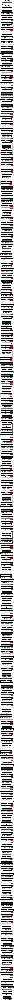

In [ ]:
# Freeze all layers in EfficientNetV2B3 to use it solely as a feature extractor
effnet.trainable = False

# Create an input layer
inputs = tfk.Input(shape=input_shape, name='input_layer')

augmentation = tf.keras.Sequential([
        tfkl.RandomFlip("horizontal_and_vertical"),
        tfkl.RandomTranslation(0.2,0.2),
        tfkl.RandomRotation(0.2),
        keras_cv.layers.GridMask(rotation_factor=0.15, seed=seed),
    ], name='preprocessing')

x = augmentation(inputs)

# Connect EfficientNetV2B3 to the input
x = effnet(x)

dense_layer = tfkl.Dense(units=512,
                              activation='relu',
                              kernel_initializer=tfk.initializers.HeUniform(seed),
                              kernel_regularizer=tf.keras.regularizers.L1L2(l1_lambda, l2_lambda),
                              name='dense_layer')(x)

dropout = tfkl.Dropout(dropout_rate, seed=seed)(dense_layer)
dense_layer = tfkl.Dense(units=128,
                              activation='relu',
                              kernel_initializer=tfk.initializers.HeUniform(seed),
                              kernel_regularizer=tf.keras.regularizers.L1L2(l1_lambda, l2_lambda),
                              name='dense_layer')(x)

dropout = tfkl.Dropout(dropout_rate, seed=seed)(dense_layer)
outputs = tfkl.Dense(units=output_shape,
                          activation='softmax',
                          kernel_initializer=tfk.initializers.HeUniform(seed),
                          kernel_regularizer=tf.keras.regularizers.L1L2(l1_lambda, l2_lambda),
                          name='output_layer')(dropout)

# Create a Model connecting input and output
model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with Categorical Cross-Entropy loss and Adam optimizer
model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics=['accuracy'])

# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

## 🦾 Train model

In [ ]:
# Train the model with early stopping callback
history = model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=callbacks
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/200


2024-11-22 15:40:52.043313: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


423/423 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - accuracy: 0.2946 - loss: 1.9092 - val_accuracy: 0.4570 - val_loss: 1.5481
Epoch 2/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4038 - loss: 1.6545 - val_accuracy: 0.4779 - val_loss: 1.4525
Epoch 3/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4184 - loss: 1.6086 - val_accuracy: 0.5007 - val_loss: 1.4556
Epoch 4/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4289 - loss: 1.5885 - val_accuracy: 0.5160 - val_loss: 1.4320
Epoch 5/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4494 - loss: 1.5407 - val_accuracy: 0.4928 - val_loss: 1.4317
Epoch 6/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4499 - loss: 1.5431 - val_accuracy: 0.5249 - val_loss: 1.3865
Epoch 7/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.4506 - loss: 1.5279 - val_accuracy: 0.5105 - val_loss: 1.4018
Epoch 8/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.4640 - loss: 1.5185 - val_

Save the trained model

In [ ]:
# Save the trained model to a file with the accuracy included in the filename
if not KAGGLE:
  %cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 1/Dany_Lollo_Batta_Batu_ANN/Lollo

model_filename = 'effnetTL.keras'
model.save(model_filename)

# Delete the model to free up resources
del model

Plot loss and accuracy

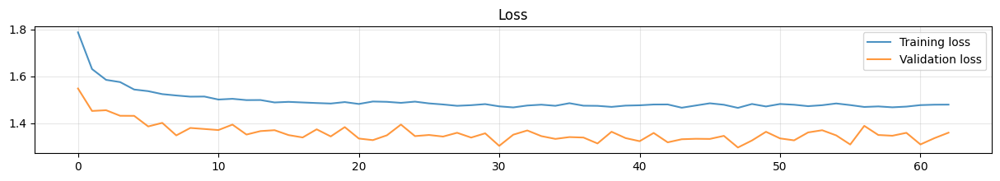

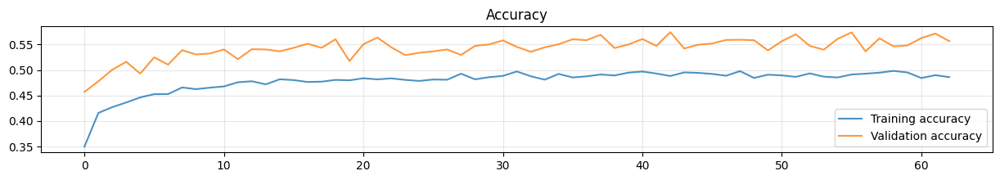

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

## 🔮 Make predictions

In [ ]:
# Load the saved model
model = tfk.models.load_model(model_filename)

In [ ]:
# Predict class probabilities and get predicted classes
test_predictions = model.predict(X_test, verbose=0)
test_predictions = np.argmax(test_predictions, axis=-1)

# Extract ground truth classes
test_gt = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
test_accuracy = accuracy_score(test_gt, test_predictions)
print(f'Accuracy score over the test set: {round(test_accuracy, 4)}')

# Calculate and display test set precision
test_precision = precision_score(test_gt, test_predictions, average='weighted')
print(f'Precision score over the test set: {round(test_precision, 4)}')

# Calculate and display test set recall
test_recall = recall_score(test_gt, test_predictions, average='weighted')
print(f'Recall score over the test set: {round(test_recall, 4)}')

# Calculate and display test set F1 score
test_f1 = f1_score(test_gt, test_predictions, average='weighted')
print(f'F1 score over the test set: {round(test_f1, 4)}')

Accuracy score over the test set: 0.5477
Precision score over the test set: 0.5665
Recall score over the test set: 0.5477
F1 score over the test set: 0.5525


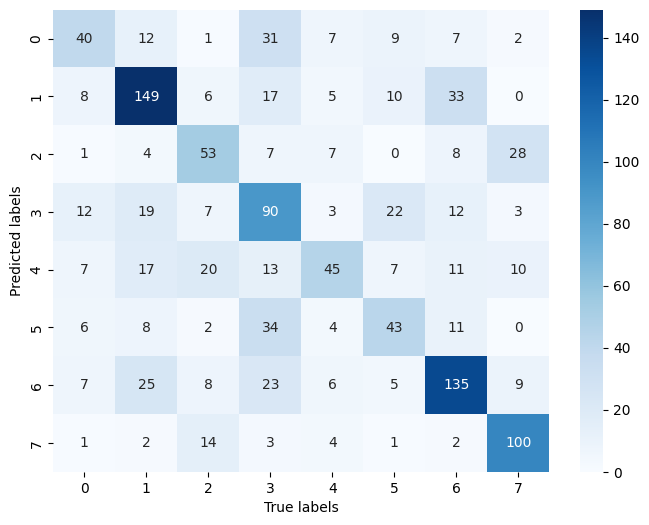

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(test_predictions, test_gt)

# Create labels combining confusion matrix values
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix with class labels
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', xticklabels=['0', '1', '2','3','4','5','6','7'], yticklabels=['0', '1', '2','3','4','5','6','7'], cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

# 🎛️ Gradual unfreezing N=75

In [ ]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('effnetTL.keras')

In [ ]:
## We set all trainable and then not trainable to avoid some bugs that occur sometimes

# Set the EfficientNetV2B3 model layers as trainable
ft_model.get_layer('efficientnetv2-b3').trainable = True

# Set all EfficientNetV2B3 layers as non-trainable
for layer in ft_model.get_layer('efficientnetv2-b3').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True

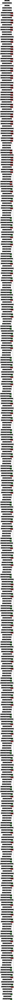

In [ ]:
# Set the number of layers to freeze
N = 75

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

## 🦾 Train model

In [ ]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = batch_size,
    epochs = 200,
    validation_data = (X_val, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/200


2024-11-22 16:13:23.967600: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


423/423 ━━━━━━━━━━━━━━━━━━━━ 82s 119ms/step - accuracy: 0.5668 - loss: 1.2914 - val_accuracy: 0.7387 - val_loss: 0.8300
Epoch 2/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.7001 - loss: 0.9311 - val_accuracy: 0.7652 - val_loss: 0.7678
Epoch 3/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.7485 - loss: 0.8097 - val_accuracy: 0.8001 - val_loss: 0.6644
Epoch 4/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.7706 - loss: 0.7345 - val_accuracy: 0.7908 - val_loss: 0.6695
Epoch 5/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.7886 - loss: 0.6866 - val_accuracy: 0.8280 - val_loss: 0.6173
Epoch 6/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.8139 - loss: 0.6475 - val_accuracy: 0.8377 - val_loss: 0.5744
Epoch 7/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.8276 - loss: 0.5966 - val_accuracy: 0.8359 - val_loss: 0.5504
Epoch 8/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - accuracy: 0.8421 - loss: 0.569

In [ ]:
# Save the trained model to a file
model_filename = 'weights75.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model

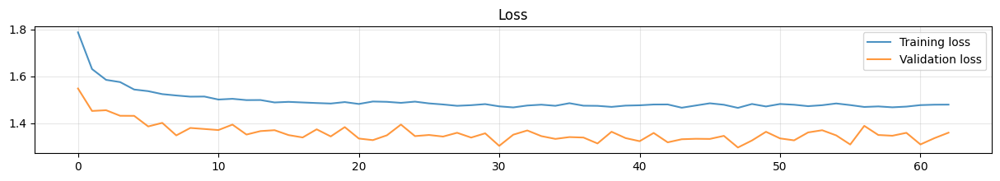

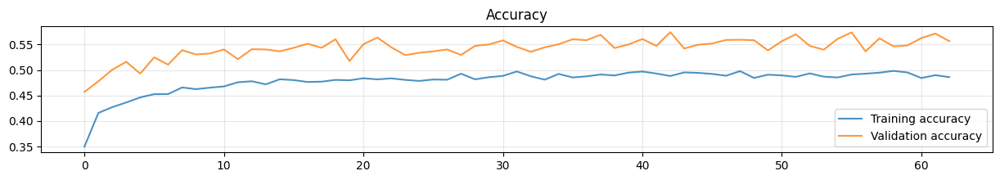

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

## 🔮 Make predictions

In [ ]:
# Load the saved model
model = tfk.models.load_model(model_filename)

In [ ]:
# Predict class probabilities and get predicted classes
test_predictions = model.predict(X_test, verbose=0)
test_predictions = np.argmax(test_predictions, axis=-1)

# Extract ground truth classes
test_gt = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
test_accuracy = accuracy_score(test_gt, test_predictions)
print(f'Accuracy score over the test set: {round(test_accuracy, 4)}')

# Calculate and display test set precision
test_precision = precision_score(test_gt, test_predictions, average='weighted')
print(f'Precision score over the test set: {round(test_precision, 4)}')

# Calculate and display test set recall
test_recall = recall_score(test_gt, test_predictions, average='weighted')
print(f'Recall score over the test set: {round(test_recall, 4)}')

# Calculate and display test set F1 score
test_f1 = f1_score(test_gt, test_predictions, average='weighted')
print(f'F1 score over the test set: {round(test_f1, 4)}')

Accuracy score over the test set: 0.8587
Precision score over the test set: 0.8613
Recall score over the test set: 0.8587
F1 score over the test set: 0.8586


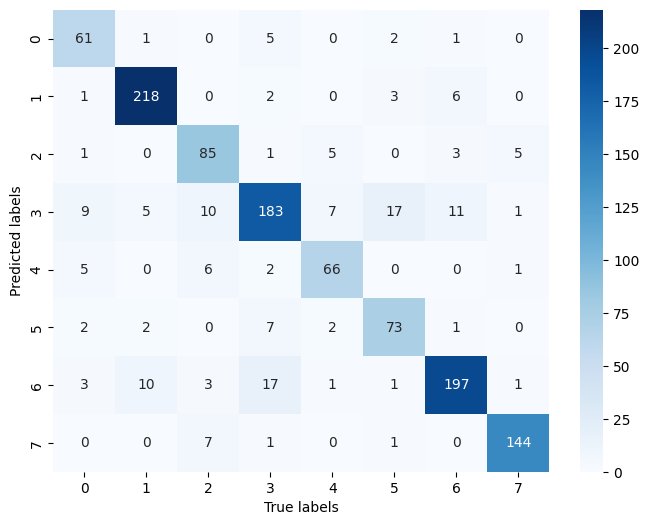

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(test_predictions, test_gt)

# Create labels combining confusion matrix values
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix with class labels
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', xticklabels=['0', '1', '2','3','4','5','6','7'], yticklabels=['0', '1', '2','3','4','5','6','7'], cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

# 🎛️ Gradual unfreezing N=45

In [ ]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model(model_filename)

## We set all trainable and then not trainable to avoid some bugs that occur sometimes

# Set the EfficientNetV2B3 model layers as trainable
ft_model.get_layer('efficientnetv2-b3').trainable = True

# Set all EfficientNetV2B3 layers as non-trainable
for layer in ft_model.get_layer('efficientnetv2-b3').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True

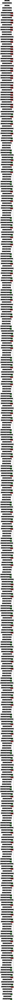

In [ ]:
# Set the number of layers to freeze
N = 45

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

## 🦾 Train model

In [ ]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = batch_size,
    epochs = 200,
    validation_data = (X_val, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/200


2024-11-22 16:44:19.490450: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


423/423 ━━━━━━━━━━━━━━━━━━━━ 84s 122ms/step - accuracy: 0.9023 - loss: 0.3635 - val_accuracy: 0.8415 - val_loss: 0.6751
Epoch 2/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 47s 111ms/step - accuracy: 0.9127 - loss: 0.3436 - val_accuracy: 0.8545 - val_loss: 0.5781
Epoch 3/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - accuracy: 0.9209 - loss: 0.3253 - val_accuracy: 0.8694 - val_loss: 0.5244
Epoch 4/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - accuracy: 0.9192 - loss: 0.3238 - val_accuracy: 0.8624 - val_loss: 0.5163
Epoch 5/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - accuracy: 0.9255 - loss: 0.3048 - val_accuracy: 0.8559 - val_loss: 0.5704
Epoch 6/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - accuracy: 0.9298 - loss: 0.2864 - val_accuracy: 0.8740 - val_loss: 0.5080
Epoch 7/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 47s 112ms/step - accuracy: 0.9355 - loss: 0.2665 - val_accuracy: 0.8587 - val_loss: 0.5662
Epoch 8/200
423/423 ━━━━━━━━━━━━━━━━━━━━ 47s 111ms/step - accuracy: 0.9401 - loss: 0.261

In [ ]:
# Save the trained model to a file
model_filename = 'weights45.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model

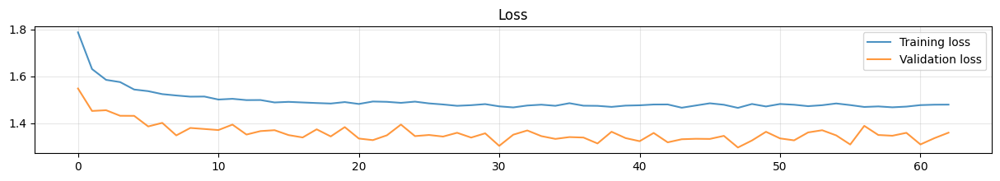

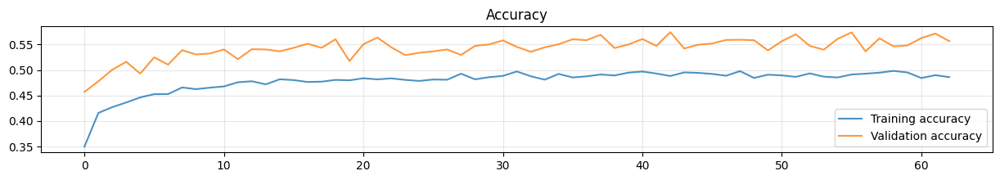

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

## 🔮 Make predictions

In [ ]:
# Load the saved model
model = tfk.models.load_model(model_filename)

In [ ]:
# Predict class probabilities and get predicted classes
test_predictions = model.predict(X_test, verbose=0)
test_predictions = np.argmax(test_predictions, axis=-1)

# Extract ground truth classes
test_gt = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
test_accuracy = accuracy_score(test_gt, test_predictions)
print(f'Accuracy score over the test set: {round(test_accuracy, 4)}')

# Calculate and display test set precision
test_precision = precision_score(test_gt, test_predictions, average='weighted')
print(f'Precision score over the test set: {round(test_precision, 4)}')

# Calculate and display test set recall
test_recall = recall_score(test_gt, test_predictions, average='weighted')
print(f'Recall score over the test set: {round(test_recall, 4)}')

# Calculate and display test set F1 score
test_f1 = f1_score(test_gt, test_predictions, average='weighted')
print(f'F1 score over the test set: {round(test_f1, 4)}')

Accuracy score over the test set: 0.8746
Precision score over the test set: 0.8776
Recall score over the test set: 0.8746
F1 score over the test set: 0.8749


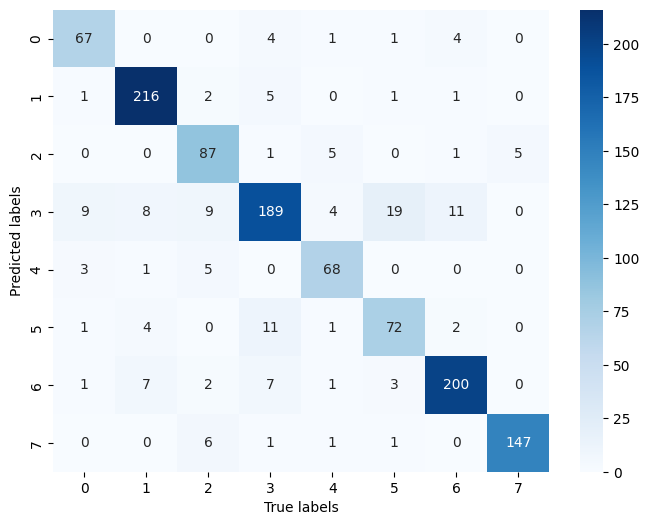

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(test_predictions, test_gt)

# Create labels combining confusion matrix values
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix with class labels
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', xticklabels=['0', '1', '2','3','4','5','6','7'], yticklabels=['0', '1', '2','3','4','5','6','7'], cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

# 🎛️ Gradual unfreezing N=15

In [ ]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('weights45.keras')

## We set all trainable and then not trainable to avoid some bugs that occur sometimes

# Set the EfficientNetV2B3 model layers as trainable
ft_model.get_layer('efficientnetv2-b3').trainable = True

# Set all EfficientNetV2B3 layers as non-trainable
for layer in ft_model.get_layer('efficientnetv2-b3').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True

In [ ]:
##### Set the number of layers to freeze
N = 15

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

In [ ]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

## 🦾 Train model

In [ ]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 64,
    epochs = 200,
    validation_data = (X_val, y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=20, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/200


2024-11-22 18:25:15.639315: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


212/212 ━━━━━━━━━━━━━━━━━━━━ 84s 232ms/step - accuracy: 0.9689 - loss: 0.1473 - val_accuracy: 0.8680 - val_loss: 0.5944
Epoch 2/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 44s 207ms/step - accuracy: 0.9711 - loss: 0.1309 - val_accuracy: 0.8694 - val_loss: 0.5435
Epoch 3/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 44s 205ms/step - accuracy: 0.9763 - loss: 0.1136 - val_accuracy: 0.8740 - val_loss: 0.5690
Epoch 4/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 44s 207ms/step - accuracy: 0.9743 - loss: 0.1261 - val_accuracy: 0.8745 - val_loss: 0.5594
Epoch 5/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 43s 205ms/step - accuracy: 0.9744 - loss: 0.1192 - val_accuracy: 0.8484 - val_loss: 0.6563
Epoch 6/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 44s 207ms/step - accuracy: 0.9765 - loss: 0.1148 - val_accuracy: 0.8703 - val_loss: 0.5873
Epoch 7/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 44s 208ms/step - accuracy: 0.9765 - loss: 0.1109 - val_accuracy: 0.8689 - val_loss: 0.6263
Epoch 8/200
212/212 ━━━━━━━━━━━━━━━━━━━━ 44s 207ms/step - accuracy: 0.9767 - loss: 0.107

In [ ]:
# Save the trained model to a file
model_filename = 'weights15.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model

## 🔮 Make predictions

In [ ]:
# Load the saved model
model = tfk.models.load_model(model_filename)

In [ ]:
# Predict class probabilities and get predicted classes
test_predictions = model.predict(X_test, verbose=0)
test_predictions = np.argmax(test_predictions, axis=-1)

# Extract ground truth classes
test_gt = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
test_accuracy = accuracy_score(test_gt, test_predictions)
print(f'Accuracy score over the test set: {round(test_accuracy, 4)}')

# Calculate and display test set precision
test_precision = precision_score(test_gt, test_predictions, average='weighted')
print(f'Precision score over the test set: {round(test_precision, 4)}')

# Calculate and display test set recall
test_recall = recall_score(test_gt, test_predictions, average='weighted')
print(f'Recall score over the test set: {round(test_recall, 4)}')

# Calculate and display test set F1 score
test_f1 = f1_score(test_gt, test_predictions, average='weighted')
print(f'F1 score over the test set: {round(test_f1, 4)}')

Accuracy score over the test set: 0.8779
Precision score over the test set: 0.8796
Recall score over the test set: 0.8779
F1 score over the test set: 0.8774


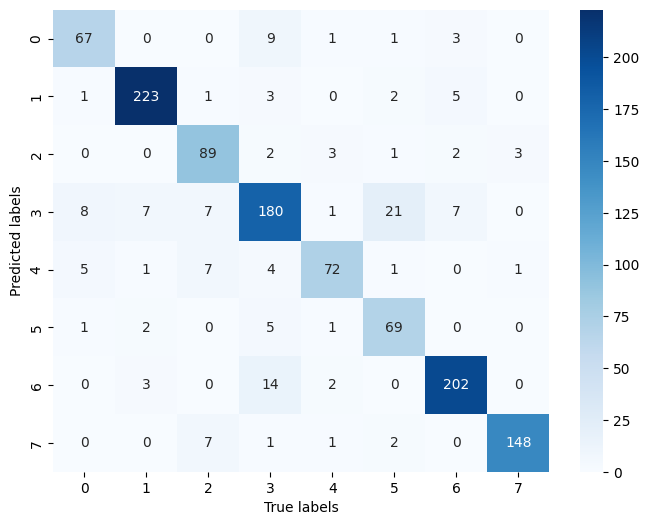

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(test_predictions, test_gt)

# Create labels combining confusion matrix values
labels = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix with class labels
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=labels, fmt='', xticklabels=['0', '1', '2','3','4','5','6','7'], yticklabels=['0', '1', '2','3','4','5','6','7'], cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

# ♻️ Train on validation and test sets

Prepare new train set

In [ ]:
X_extra = np.concatenate((X_val, X_test))
y_extra = np.concatenate((y_val, y_test))

# Reshape the data for SMOTE
X_extra_reshaped = X_extra.reshape(X_extra.shape[0], -1)

# Apply SMOTE
smote = SMOTE(random_state=seed)
X_extra_smote, y_extra_smote = smote.fit_resample(X_extra_reshaped, np.argmax(y_extra, axis=1))

# Reshape the data back to its original shape
X_extra_smote = X_extra_smote.reshape(-1, 96, 96, 3)

X_train = X_extra_smote
y_train = tfk.utils.to_categorical(y_extra_smote)

# Now X_train and y_train contain the oversampled data
print(f"X_extra shape: {X_extra.shape}, y_extra shape: {y_extra.shape}")

X_extra shape: (3347, 96, 96, 3), y_extra shape: (3347, 8)


Retrain with val and test sets, applying gradual unfreezing

In [ ]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('/kaggle/input/effnet15/keras/default/1/weights15.keras')

## We set all trainable and then not trainable to avoid some bugs that occur sometimes

# Set the EfficientNetV2B3 model layers as trainable
ft_model.get_layer('efficientnetv2-b3').trainable = True

# Set all EfficientNetV2B3 layers as non-trainable
for layer in ft_model.get_layer('efficientnetv2-b3').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True

In [ ]:
##### Set the number of layers to freeze
N = 75

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 32,
    epochs = 10,
).history

Epoch 1/10


2024-11-23 08:21:29.206110: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


161/161 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - accuracy: 0.8460 - loss: 0.5242
Epoch 2/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.8848 - loss: 0.3640
Epoch 3/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - accuracy: 0.9047 - loss: 0.3105
Epoch 4/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9155 - loss: 0.2599
Epoch 5/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9294 - loss: 0.2421
Epoch 6/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9393 - loss: 0.2264
Epoch 7/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9482 - loss: 0.1957
Epoch 8/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9485 - loss: 0.1882
Epoch 9/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9459 - loss: 0.1876
Epoch 10/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9573 - loss: 0.1616


In [ ]:
##### Set the number of layers to freeze
N = 45

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 32,
    epochs = 10,
).history


Epoch 1/10


2024-11-23 08:24:47.205448: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


161/161 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - accuracy: 0.9529 - loss: 0.1756
Epoch 2/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9658 - loss: 0.1367
Epoch 3/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - accuracy: 0.9624 - loss: 0.1457
Epoch 4/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9642 - loss: 0.1356
Epoch 5/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9662 - loss: 0.1347
Epoch 6/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9692 - loss: 0.1275
Epoch 7/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9689 - loss: 0.1310
Epoch 8/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9799 - loss: 0.0966
Epoch 9/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9677 - loss: 0.1261
Epoch 10/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9760 - loss: 0.0995


In [ ]:
##### Set the number of layers to freeze
N = 15

# Set the first N layers as non-trainable
for i, layer in enumerate(ft_model.get_layer('efficientnetv2-b3').layers[:N]):
    layer.trainable = False

# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(1e-4), metrics=['accuracy'])

# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 32,
    epochs = 10,
).history


Epoch 1/10


2024-11-23 08:28:05.627501: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/model_1/efficientnetv2-b3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


161/161 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - accuracy: 0.9738 - loss: 0.1070
Epoch 2/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9776 - loss: 0.0960
Epoch 3/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9753 - loss: 0.1119
Epoch 4/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - accuracy: 0.9770 - loss: 0.1062
Epoch 5/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9697 - loss: 0.1287
Epoch 6/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - accuracy: 0.9729 - loss: 0.1123
Epoch 7/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9785 - loss: 0.1030
Epoch 8/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - accuracy: 0.9820 - loss: 0.0964
Epoch 9/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.9825 - loss: 0.0893
Epoch 10/10
161/161 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - accuracy: 0.9814 - loss: 0.0821


In [ ]:
# Save the trained model to a file
model_filename = 'weights.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model